In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import Image

In [2]:
fig, ax = plt.subplots()
ax.set_aspect('equal')
plt.close()
numFrames = 1000
center = np.array([0.5, np.sqrt(3)/6])
def pickPoint(f):
    breakPoint = np.floor(numFrames*0.75)
    ret = np.array([0.5, np.sqrt(3)/6])
    if f <= breakPoint:
        radius = f*np.sqrt(3)/(6*breakPoint)
        angle = 2*np.pi*f/breakPoint
        ret[0] = center[0] + radius*np.sin(angle)
        ret[1] = center[1] + radius*np.cos(angle)
        return ret
    remainder = numFrames - breakPoint
    rem2 = f - breakPoint
    return np.array([0.5, (np.sqrt(3)/3)+(rem2*np.sqrt(3))/(remainder*6)])

In [8]:
def viviani(i):
    ax.clear()
    #Build triangle
    ax.plot([0, 1], [0, 0], 'k')
    ax.plot([0, 0.5], [0, np.sqrt(3)/2], 'k')
    ax.plot([1, 0.5], [0, np.sqrt(3)/2], 'k')
    
    #Get point and lines
    point = pickPoint(i)
    ax.plot(point[0], point[1], 'ko')
    
    basePoint = np.array([point[0], 0])
    ax.plot([point[0], basePoint[0]], [point[1], basePoint[1]], 'b')
    
    leftDot = point[0]/2 + point[1]*np.sqrt(3)/2
    leftPoint = np.array([leftDot/2, leftDot*np.sqrt(3)/2])
    ax.plot([point[0], leftPoint[0]], [point[1], leftPoint[1]], 'r')
    
    rightDot = (point[0]-1)/-2 + point[1]*np.sqrt(3)/2
    rightPoint = np.array([rightDot/-2 + 1, rightDot*np.sqrt(3)/2])
    ax.plot([point[0], rightPoint[0]], [point[1], rightPoint[1]], 'g')
    
    #Plot dists
    lDist = np.linalg.norm(point - leftPoint)
    rDist = np.linalg.norm(point - rightPoint)
    bDist = point[1]
    ax.plot([1, 1], [0, bDist], 'b', linewidth=3.0)
    ax.plot([1, 1], [bDist, bDist+rDist], 'g', linewidth=3.0)
    ax.plot([1, 1], [bDist+rDist, bDist+rDist+lDist], 'r', linewidth=3.0)

MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


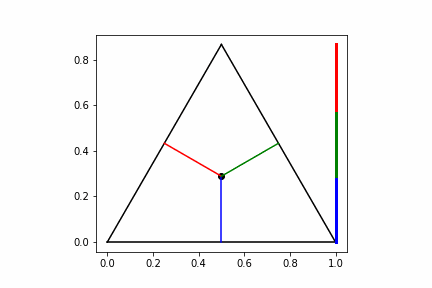

In [11]:
anim = animation.FuncAnimation(fig, viviani, frames=numFrames, repeat_delay=1000, interval=20)
anim.save('viviani.gif')
Image('viviani.gif')